In [1]:
import warnings
warnings.filterwarnings(action="ignore")

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import pandas_profiling as pp

In [3]:
# Reading data
data = pd.read_csv("credit_risk_dataset.csv")

In [4]:
# Shape of data
data.shape

(32581, 12)

In [5]:
# head of data
data.head()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,22,59000,RENT,123.0,PERSONAL,D,35000,16.02,1,0.59,Y,3
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0,0.10,N,2
2,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,1,0.57,N,3
3,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,1,0.53,N,2
4,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,1,0.55,Y,4


In [6]:
# Info of data features
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32581 entries, 0 to 32580
Data columns (total 12 columns):
person_age                    32581 non-null int64
person_income                 32581 non-null int64
person_home_ownership         32581 non-null object
person_emp_length             31686 non-null float64
loan_intent                   32581 non-null object
loan_grade                    32581 non-null object
loan_amnt                     32581 non-null int64
loan_int_rate                 29465 non-null float64
loan_status                   32581 non-null int64
loan_percent_income           32581 non-null float64
cb_person_default_on_file     32581 non-null object
cb_person_cred_hist_length    32581 non-null int64
dtypes: float64(3), int64(5), object(4)
memory usage: 3.0+ MB


In [7]:
# Data Description
data.describe()

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_cred_hist_length
count,32581.000000,3.258100e+04,31686.000000,32581.000000,29465.000000,32581.000000,32581.000000,32581.000000
mean,27.734600,6.607485e+04,4.789686,9589.371106,11.011695,0.218164,0.170203,5.804211
std,6.348078,6.198312e+04,4.142630,6322.086646,3.240459,0.413006,0.106782,4.055001
min,20.000000,4.000000e+03,0.000000,500.000000,5.420000,0.000000,0.000000,2.000000
25%,23.000000,3.850000e+04,2.000000,5000.000000,7.900000,0.000000,0.090000,3.000000
50%,26.000000,5.500000e+04,4.000000,8000.000000,10.990000,0.000000,0.150000,4.000000
75%,30.000000,7.920000e+04,7.000000,12200.000000,13.470000,0.000000,0.230000,8.000000
max,144.000000,6.000000e+06,123.000000,35000.000000,23.220000,1.000000,0.830000,30.000000


In [8]:
# Dropping null values along axis = 0(Row)
data.dropna(inplace=True,axis=0)
data.shape

(28638, 12)

# Getting Insights (Visualization)

### person_age

In [9]:
px.violin(data,y="person_age",color="loan_status",points="all")

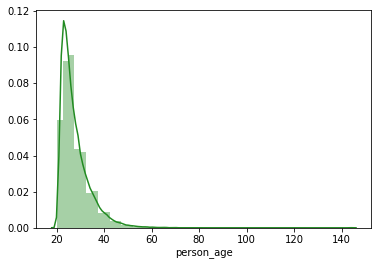

In [10]:
sns.distplot(data.person_age,label="person_age",color ="forestgreen")
plt.show()

### person_income

In [11]:
px.violin(data,y="person_income",color="loan_status",points="all")

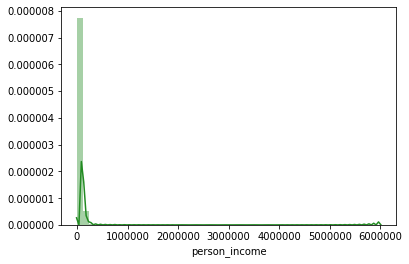

In [12]:
sns.distplot(data.person_income,label="person_income",color ="forestgreen")
plt.show()

### person_home_ownership

In [13]:
data.person_home_ownership.value_counts()

RENT        14551
MORTGAGE    11801
OWN          2192
OTHER          94
Name: person_home_ownership, dtype: int64

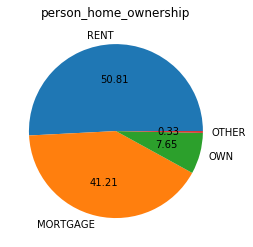

In [14]:
plt.title("person_home_ownership")
plt.pie(data.person_home_ownership.value_counts(),labels = data.person_home_ownership.value_counts().index,autopct = "%0.2f")
plt.show()

### person_emp_length

In [15]:
px.violin(data,y="person_emp_length",color="loan_status",points="all")

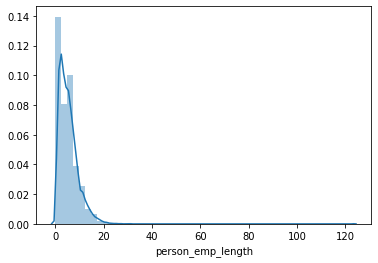

In [16]:
sns.distplot(data.person_emp_length,label = "person_emp_length")
plt.show()

### loan_intent

In [17]:
data.loan_intent.value_counts()

EDUCATION            5704
MEDICAL              5293
VENTURE              5001
PERSONAL             4877
DEBTCONSOLIDATION    4565
HOMEIMPROVEMENT      3198
Name: loan_intent, dtype: int64

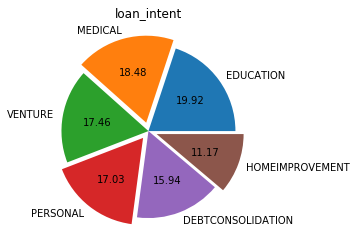

In [18]:
plt.title("loan_intent")
plt.pie(data.loan_intent.value_counts(),labels = data.loan_intent.value_counts().index,autopct = "%0.2f",explode=[0,0.1,0,0.1,0,0.1])
plt.show()

### loan_grade

In [19]:
data.loan_grade.value_counts()

A    9402
B    9151
C    5699
D    3248
E     870
F     209
G      59
Name: loan_grade, dtype: int64

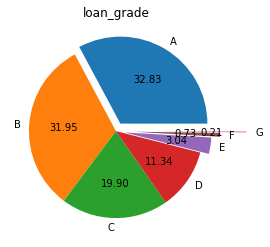

In [20]:
plt.title("loan_grade")
plt.pie(data.loan_grade.value_counts(),labels = data.loan_grade.value_counts().index,autopct = "%0.2f",explode=[0.1,0,0.0,0,0.1,0.2,0.5])
plt.show()

### loan_amnt

In [21]:
px.box(data,y="loan_amnt",color="loan_status",points="all")

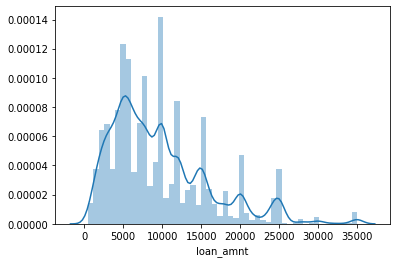

In [22]:
sns.distplot(data.loan_amnt,label = "loan_amnt")
plt.show()

### loan_int_rate

In [23]:
px.box(data,y="loan_int_rate",color="loan_status",points="all")

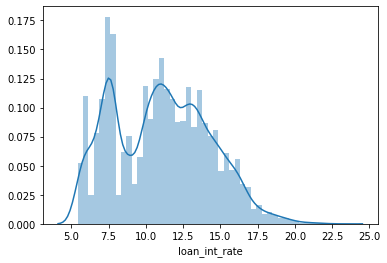

In [24]:
sns.distplot(data.loan_int_rate,label = "loan_amnt")
plt.show()

### loan_percent_income

In [25]:
px.box(data,y="loan_percent_income",color="loan_status",points="all")

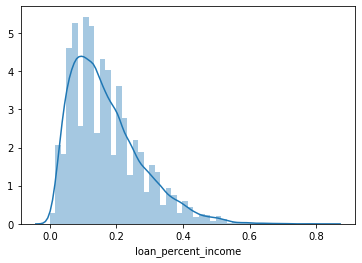

In [26]:
sns.distplot(data.loan_percent_income,label = "loan_percent_income")
plt.show()

### cb_person_default_on_file

In [27]:
data.cb_person_default_on_file.value_counts()

N    23535
Y     5103
Name: cb_person_default_on_file, dtype: int64

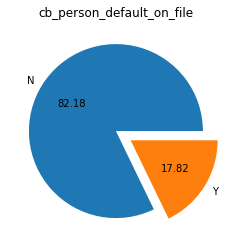

In [28]:
plt.title("cb_person_default_on_file")
plt.pie(data.cb_person_default_on_file.value_counts(),labels = data.cb_person_default_on_file.value_counts().index,autopct = "%0.2f",explode=[0,0.2])
plt.show()

### cb_person_cred_hist_length

In [29]:
data.cb_person_cred_hist_length.value_counts()

3     5233
4     5228
2     5224
7     1673
8     1665
9     1664
5     1660
6     1643
10    1635
14     436
12     426
11     410
16     387
13     387
15     370
17     347
20      29
24      27
28      22
22      21
30      19
23      19
21      18
27      18
19      18
25      17
26      16
18      15
29      11
Name: cb_person_cred_hist_length, dtype: int64

### loan_status

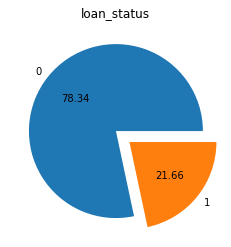

In [30]:
plt.title("loan_status")
plt.pie(data.loan_status.value_counts(),labels = data.loan_status.value_counts().index,autopct = "%0.2f",explode=[0,0.2])
plt.show()

### Parallel Plot

In [31]:
px.parallel_categories(data,color="loan_status")

### Data Report

In [35]:
pp.ProfileReport(data)

Number of variables,13
Number of observations,28638
Total Missing (%),0.0%
Total size in memory,2.8 MiB
Average record size in memory,104.0 B
Numeric,8
Categorical,4
Boolean,1
Date,0
Text (Unique),0
Rejected,0


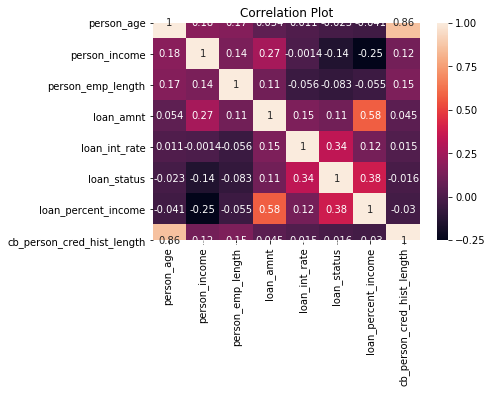

In [33]:
plt.title("Correlation Plot")
sns.heatmap(data.corr(),annot=True)
plt.show()


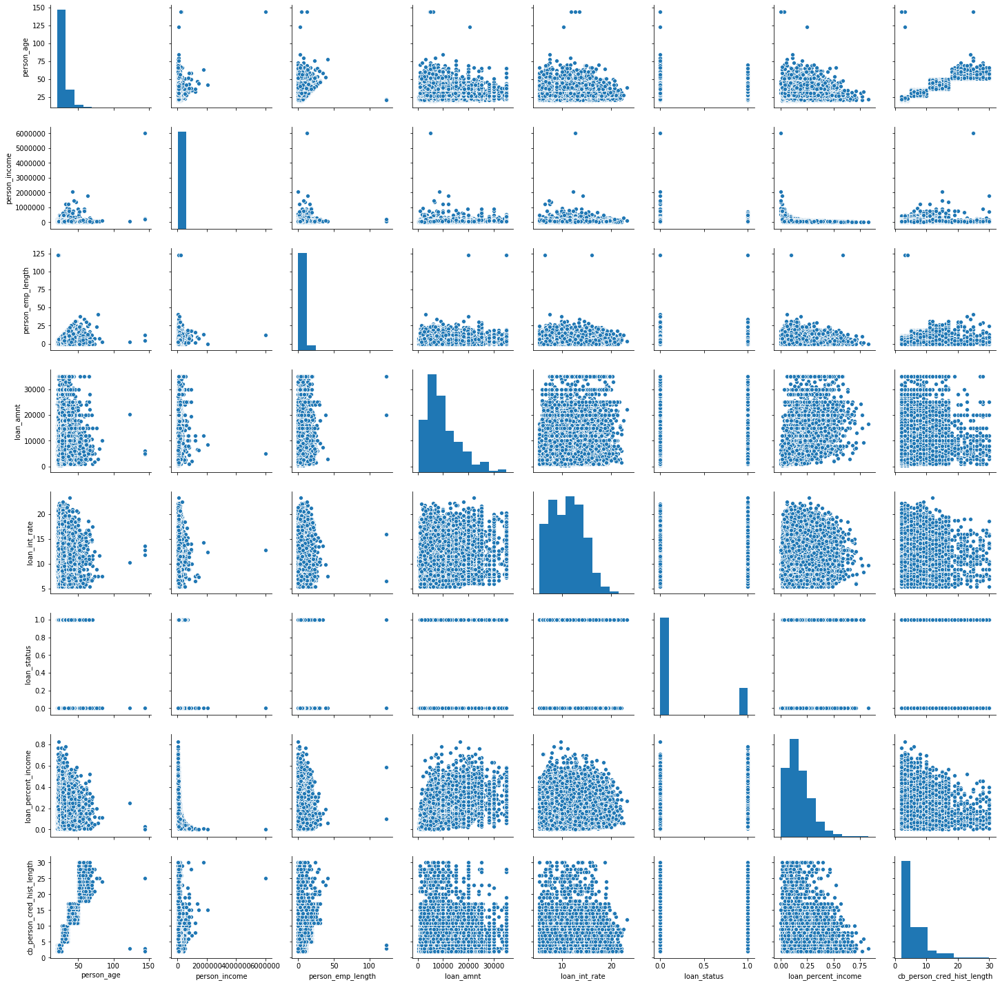

In [34]:
sns.pairplot(data, kind="scatter")
plt.show()